In [1]:
import xml.dom.minidom
import numpy as np
import os
import json
# from PIL import Image
from skimage import io, transform, util
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema, argrelmin, argrelmax
from scipy.signal import savgol_filter
from skimage.draw import polygon
from skimage.color import rgb2gray
from skimage import filters
from skimage.filters import unsharp_mask
from skimage import measure

def consecutive(data, stepsize=1):
    return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)

c:\users\jhelu\miniconda3\envs\cs682\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
c:\users\jhelu\miniconda3\envs\cs682\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
c:\users\jhelu\miniconda3\envs\cs682\lib\site-packages\numpy\.libs\libopenblas.TXA6YQSD3GCQQC22GEQ54J2UDCXDXHWN.gfortran-win_amd64.dll
  stacklevel=1)


In [48]:
import xml.dom.minidom
file_list = os.listdir("datasets/prima")
ground_truth = {}
for file_name in file_list:
    if file_name[:3] == 'pc-' and file_name[-4:] == '.xml' and file_name in keep_dict:
#         print(file_name)
        ground_truth[file_name] = {}
#         file_name = "datasets/prima/pc-00008061.xml"
        doc = xml.dom.minidom.parse("datasets/prima/"+file_name)        
        for txt_reg in doc.getElementsByTagName("TextRegion"):
            if txt_reg.getAttribute("type") == 'paragraph' and txt_reg.getAttribute("id") not in keep_dict[file_name]:# == 'r116': 

                for text in txt_reg.getElementsByTagName("TextEquiv"):
                    text_str = text.getElementsByTagName("Unicode")[0].firstChild.data
                    lines = text_str.splitlines()
#                     word_list = []
#                     for line in lines:
#                         word_list.append(line.split(' '))
#                     if len(word_list) > 2:
#                         print(txt_reg.getAttribute("type"), txt_reg.getAttribute("id"))
                    ground_truth[file_name][txt_reg.getAttribute("id")] = lines

output = open('ground_truth_all.pkl', 'wb')
pickle.dump(ground_truth, output)
output.close()

In [47]:
lines

['Corona 19. Haben Sie die Geſ\uf502i\uf502te ſelbſt verfaßt? ſie iſt ni\uf502t',
 'ſ\uf502le\uf502t; aber wir haben leider feine Verwendung dafür. Das Manu⸗',
 'ſkript liegt für Sie im Sekretariat.']

In [39]:
keep_dict = {}
keep_dict['pc-00008061.xml'] = ['r172']
keep_dict['pc-00008062.xml'] = ['r124', 'r170', 'r240']
keep_dict['pc-00008084.xml'] = []
keep_dict['pc-00008086.xml'] = ['r381']
keep_dict['pc-00008149.xml'] = ['r37']
keep_dict['pc-00674353.xml'] = ['r4622', 'r2416', 'r114', 'r2734', 'r8051', 'r17675', 'r5714']

In [46]:
ground_truth.keys()

dict_keys(['pc-00008061.xml', 'pc-00008062.xml', 'pc-00008084.xml', 'pc-00008086.xml', 'pc-00008149.xml', 'pc-00674353.xml'])

r108


c:\users\jhelu\miniconda3\envs\cs682\lib\site-packages\ipykernel_launcher.py:21: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


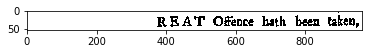

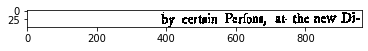

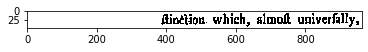

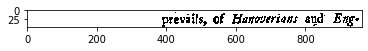

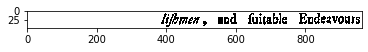

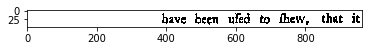

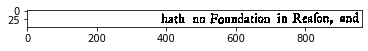

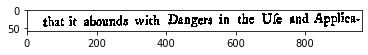

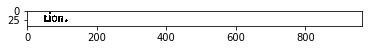

r112


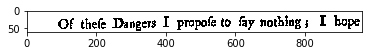

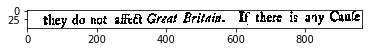

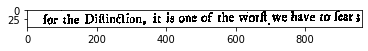

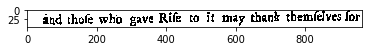

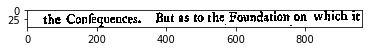

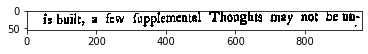

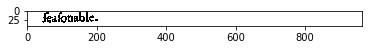

r116


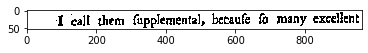

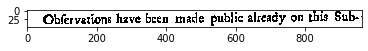

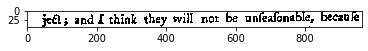

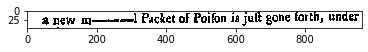

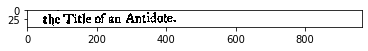

r120


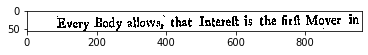

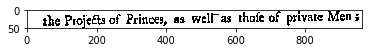

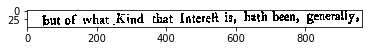

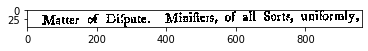

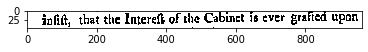

...

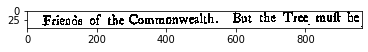

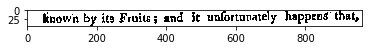

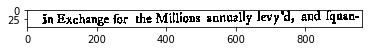

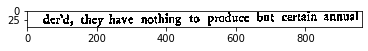

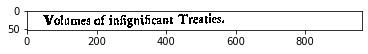

r124


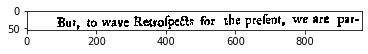

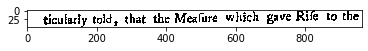

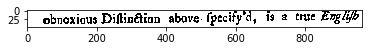

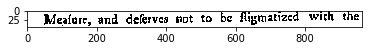

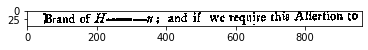

...

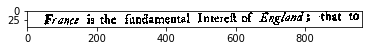

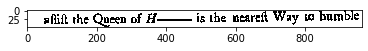

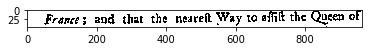

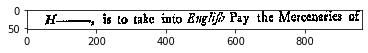

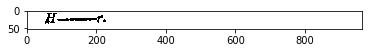

r128


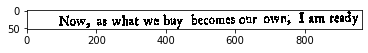

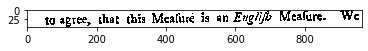

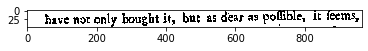

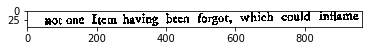

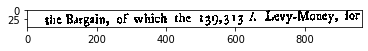

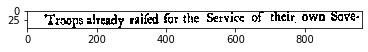

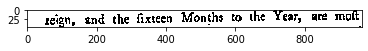

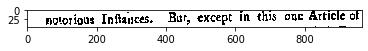

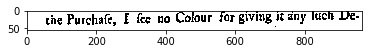

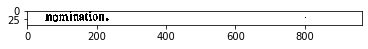

r132


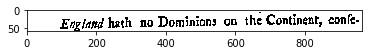

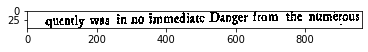

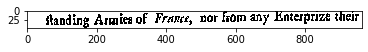

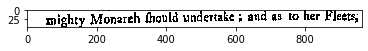

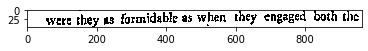

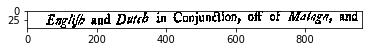

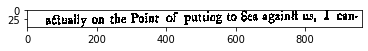

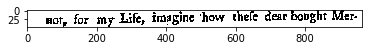

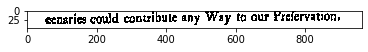

r134


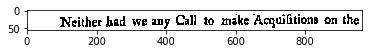

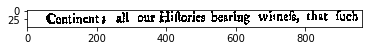

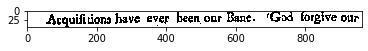

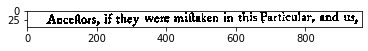

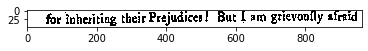

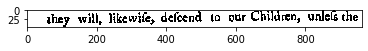

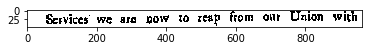

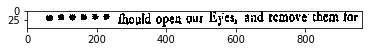

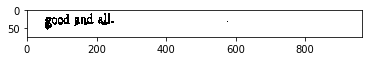

r144


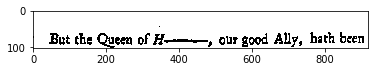

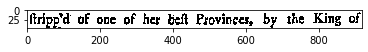

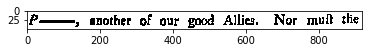

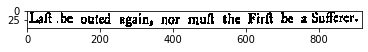

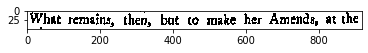

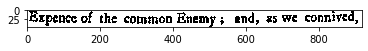

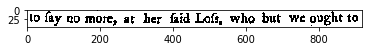

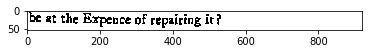

r148


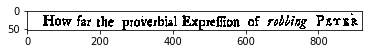

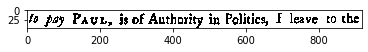

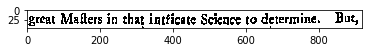

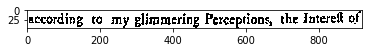

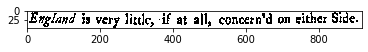

...

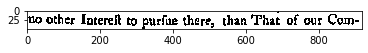

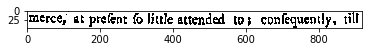

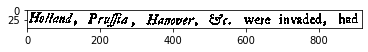

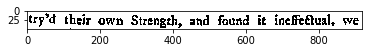

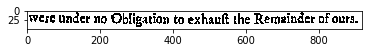

r152


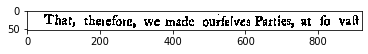

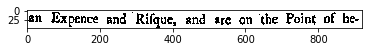

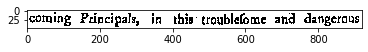

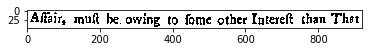

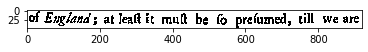

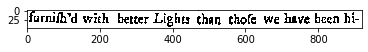

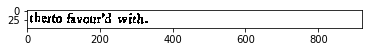

r156


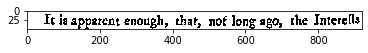

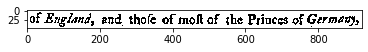

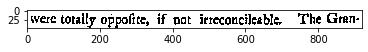

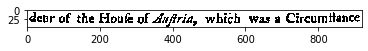

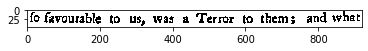

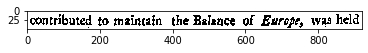

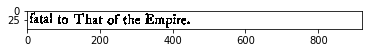

r160


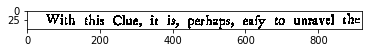

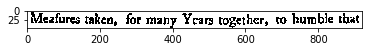

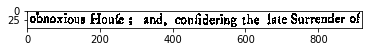

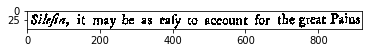

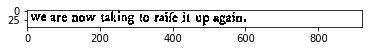

r164


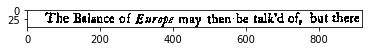

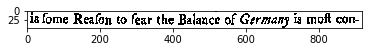

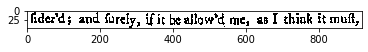

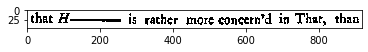

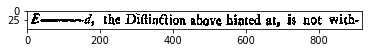

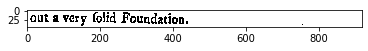

r168


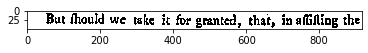

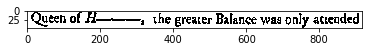

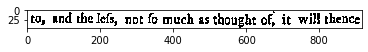

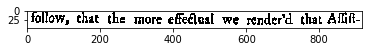

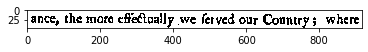

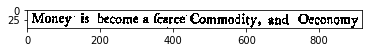

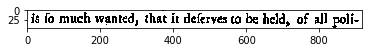

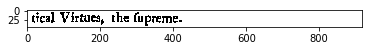

r176


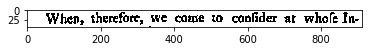

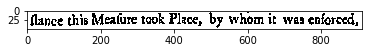

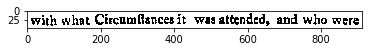

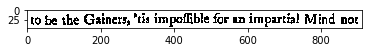

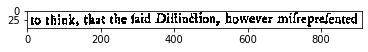

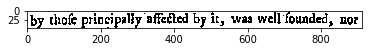

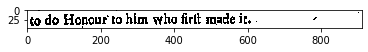

r180


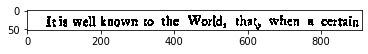

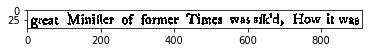

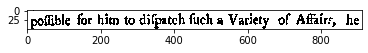

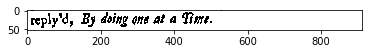

r182


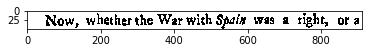

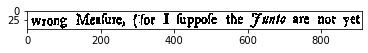

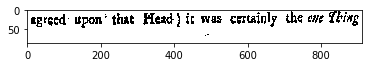

r184


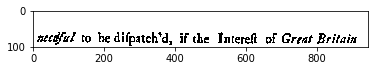

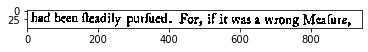

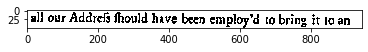

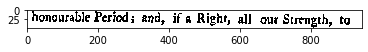

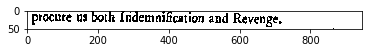

r188


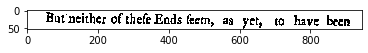

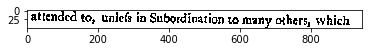

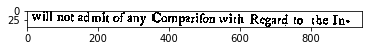

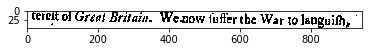

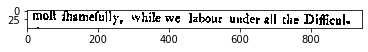

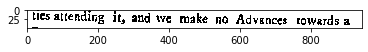

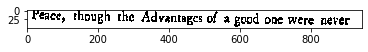

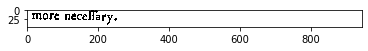

r192


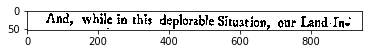

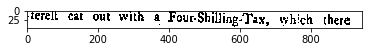

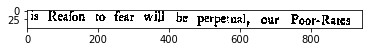

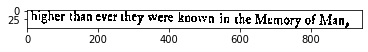

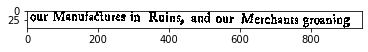

...

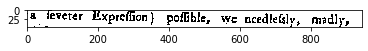

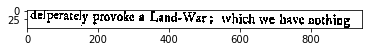

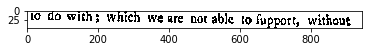

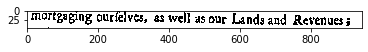

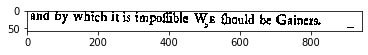

r196


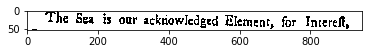

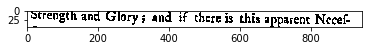

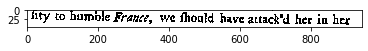

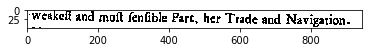

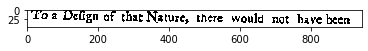

...

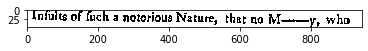

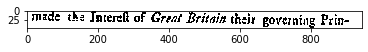

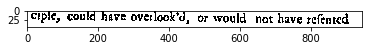

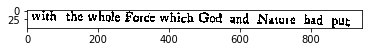

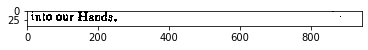

r200


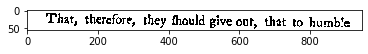

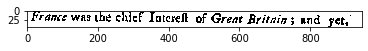

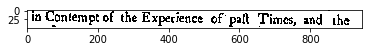

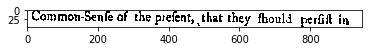

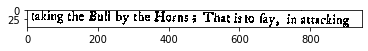

...

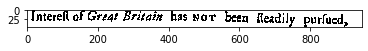

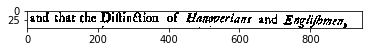

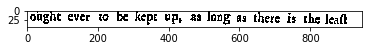

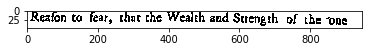

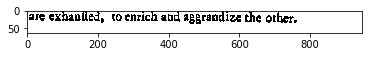

r232


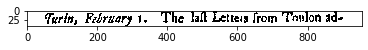

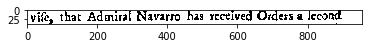

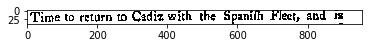

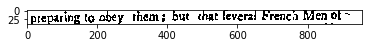

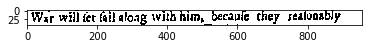

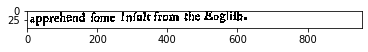

r234


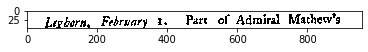

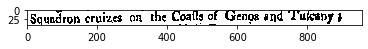

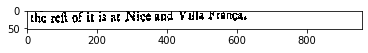

r80


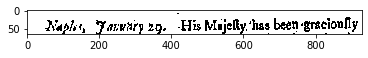

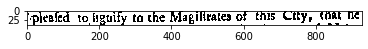

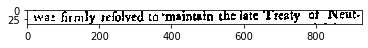

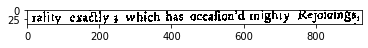

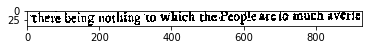

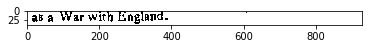

r8


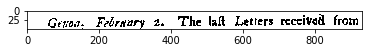

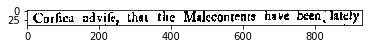

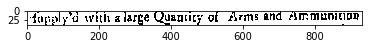

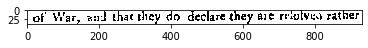

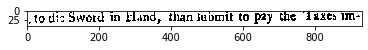

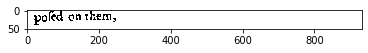

r12


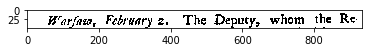

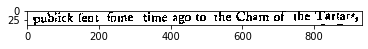

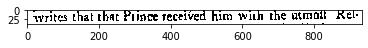

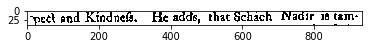

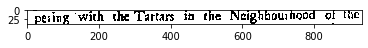

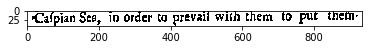

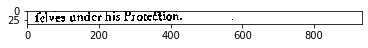

r16


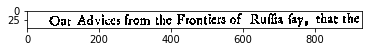

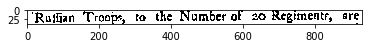

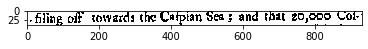

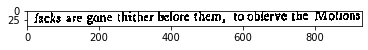

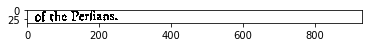

r20


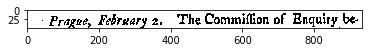

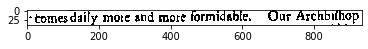

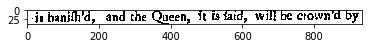

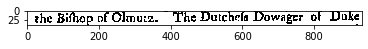

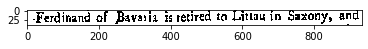

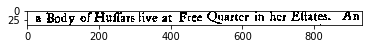

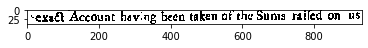

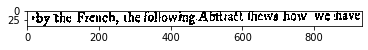

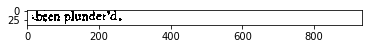

r28


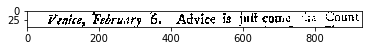

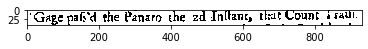

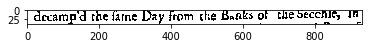

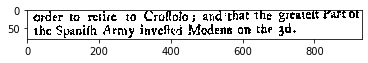

r32


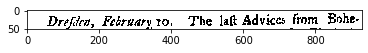

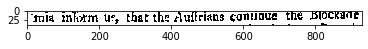

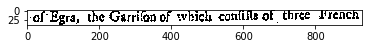

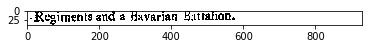

r36


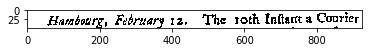

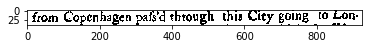

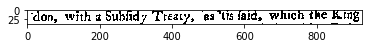

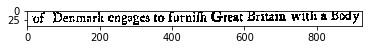

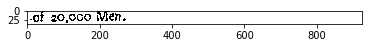

r40


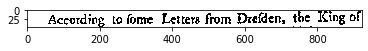

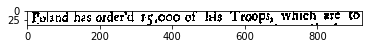

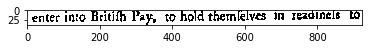

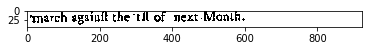

r44


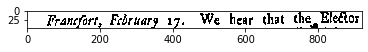

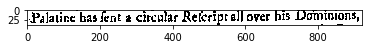

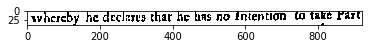

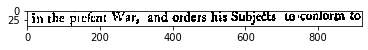

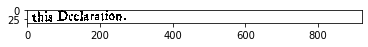

r50


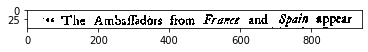

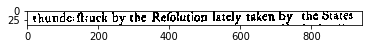

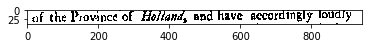

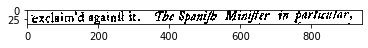

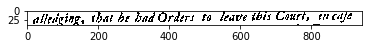

...

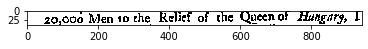

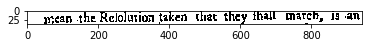

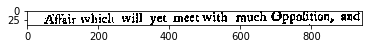

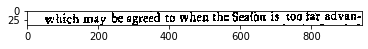

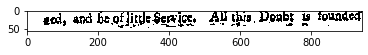

r60


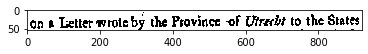

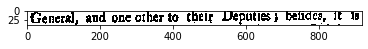

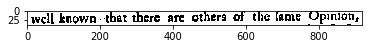

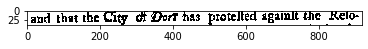

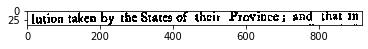

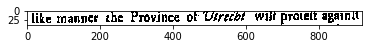

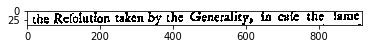

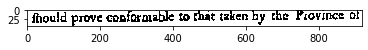

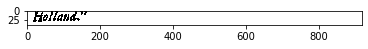

r79


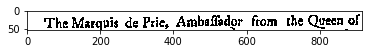

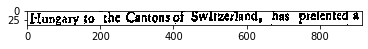

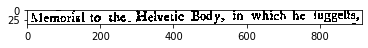

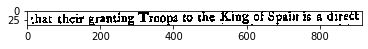

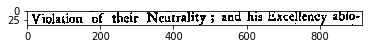

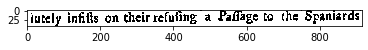

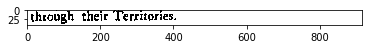

r84


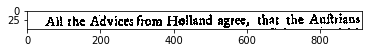

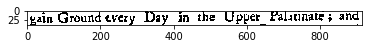

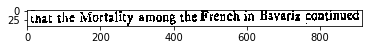

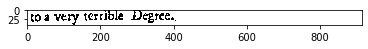

r88


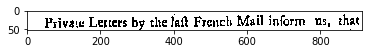

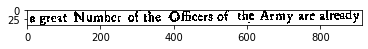

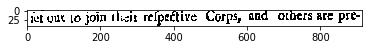

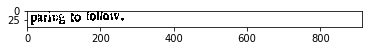

r92


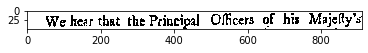

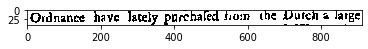

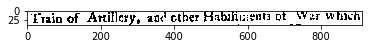

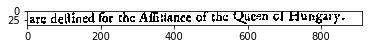

r96


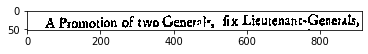

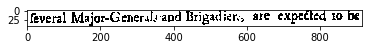

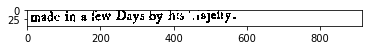

r100


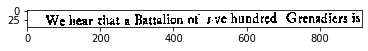

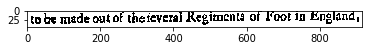

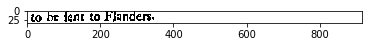

r104


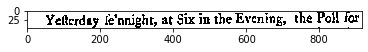

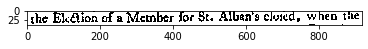

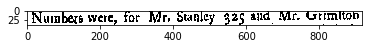

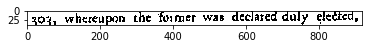

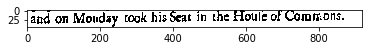

r108


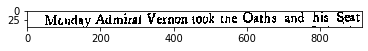

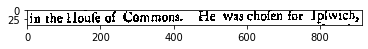

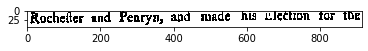

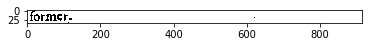

r116


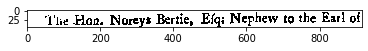

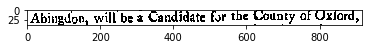

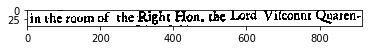

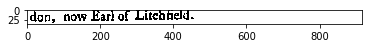

r120


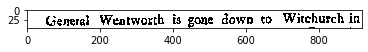

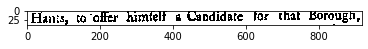

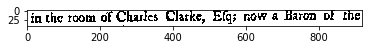

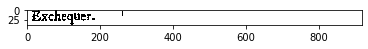

r128


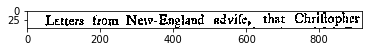

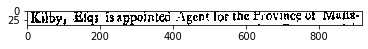

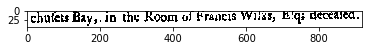

r136


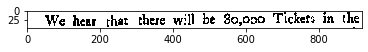

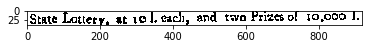

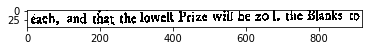

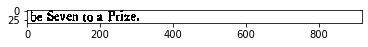

r144


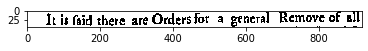

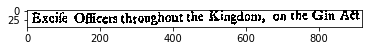

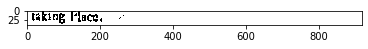

r148


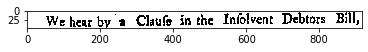

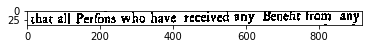

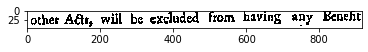

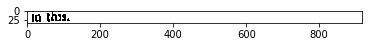

r152


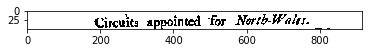

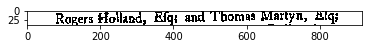

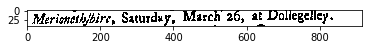

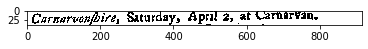

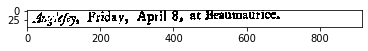

r156


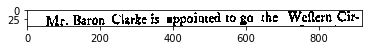

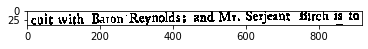

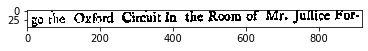

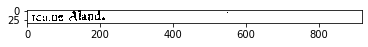

r160


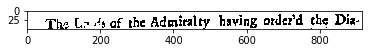

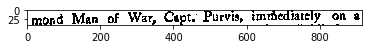

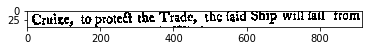

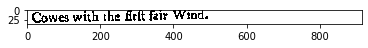

r164


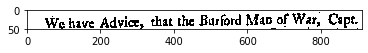

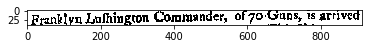

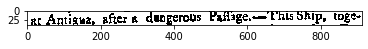

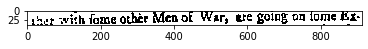

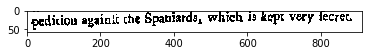

r168


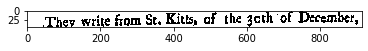

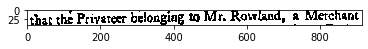

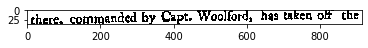

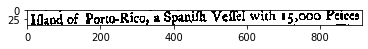

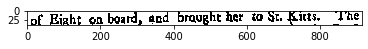

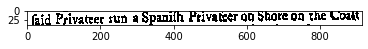

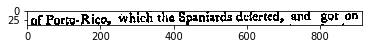

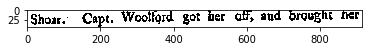

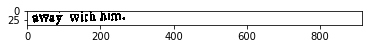

r172


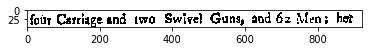

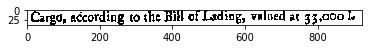

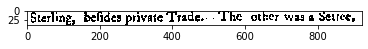

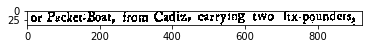

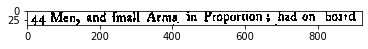

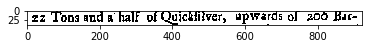

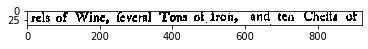

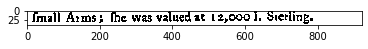

r176


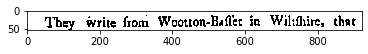

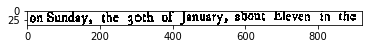

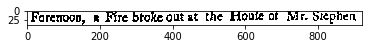

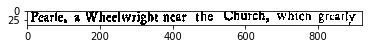

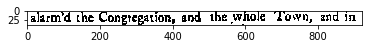

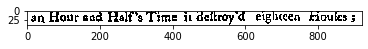

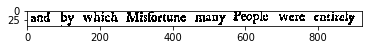

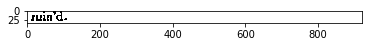

r180


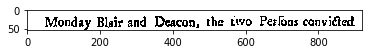

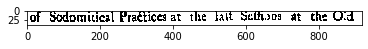

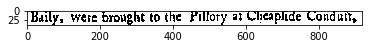

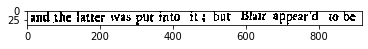

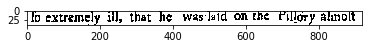

...

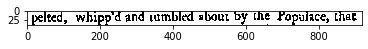

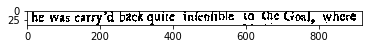

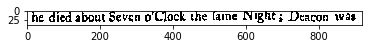

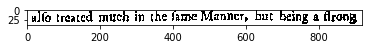

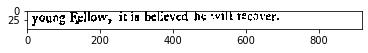

r184


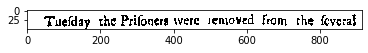

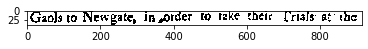

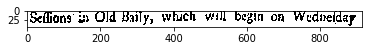

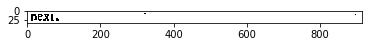

r188


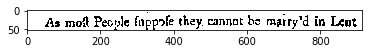

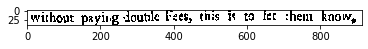

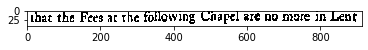

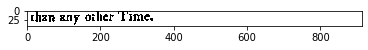

r192


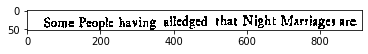

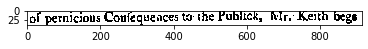

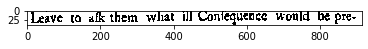

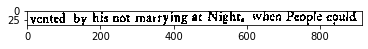

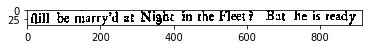

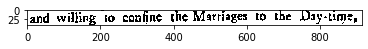

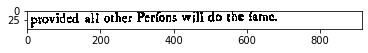

r196


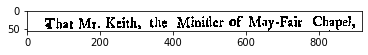

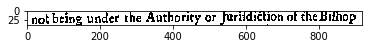

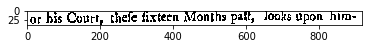

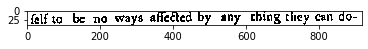

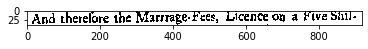

...

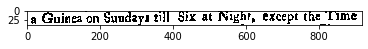

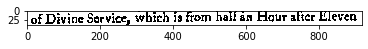

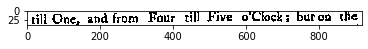

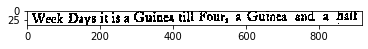

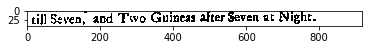

r200


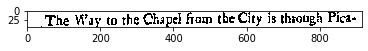

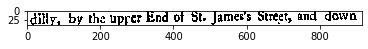

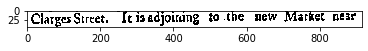

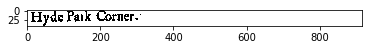

r216


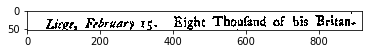

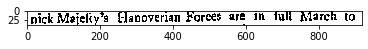

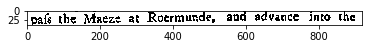

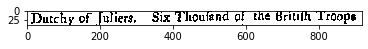

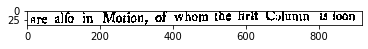

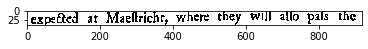

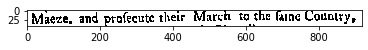

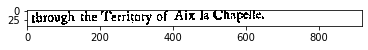

r220


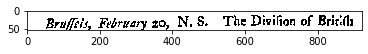

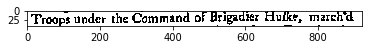

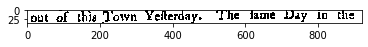

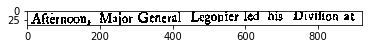

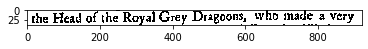

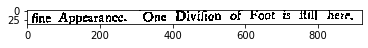

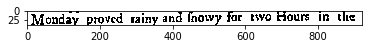

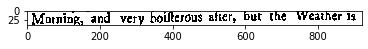

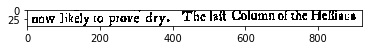

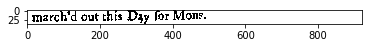

r224


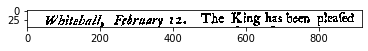

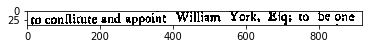

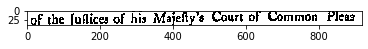

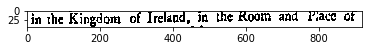

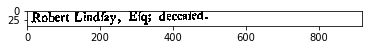

r228


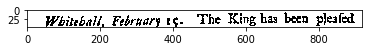

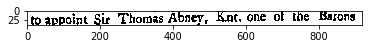

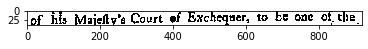

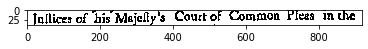

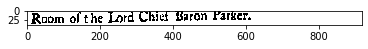

r232


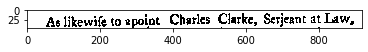

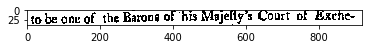

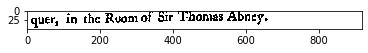

r236


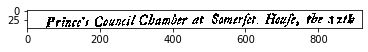

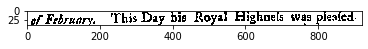

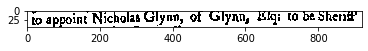

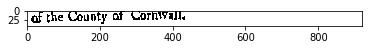

r242


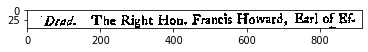

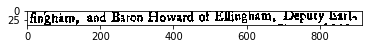

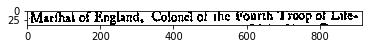

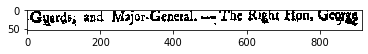

r128


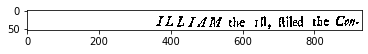

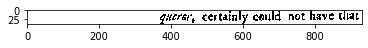

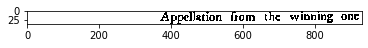

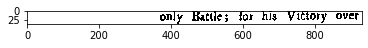

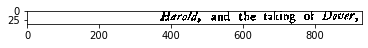

...

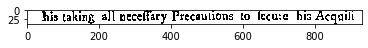

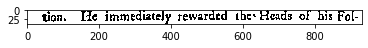

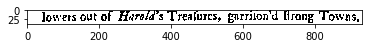

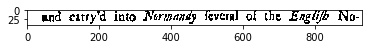

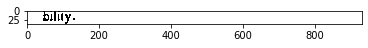

r130


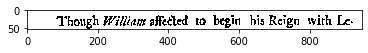

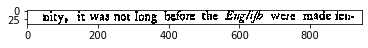

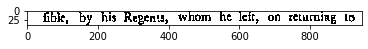

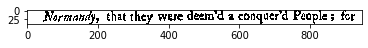

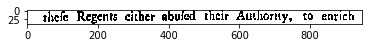

...

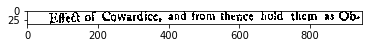

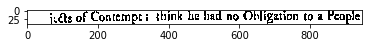

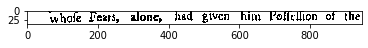

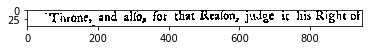

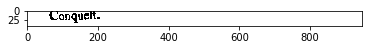

r132


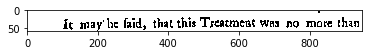

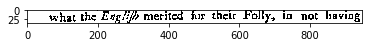

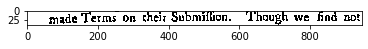

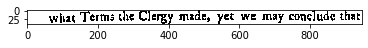

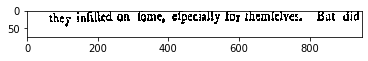

r134


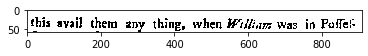

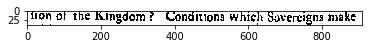

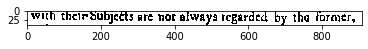

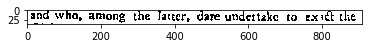

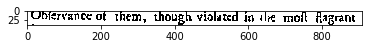

...

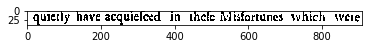

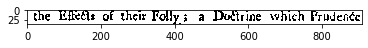

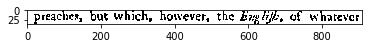

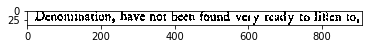

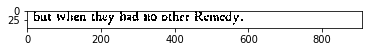

r138


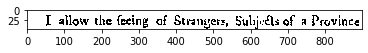

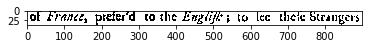

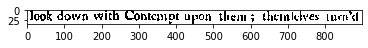

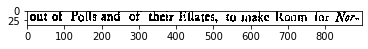

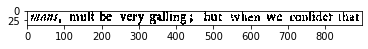

...

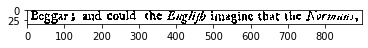

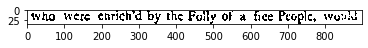

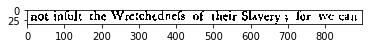

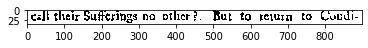

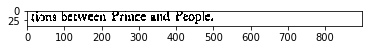

r140


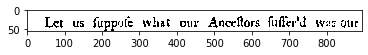

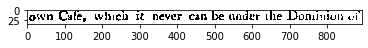

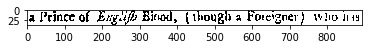

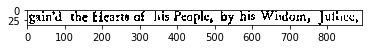

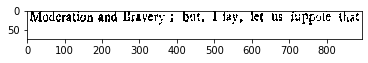

r142


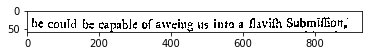

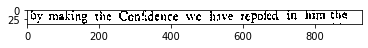

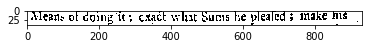

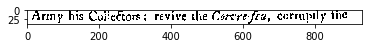

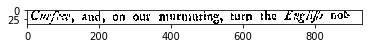

...

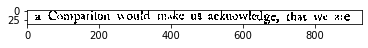

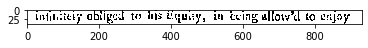

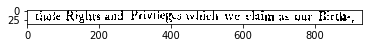

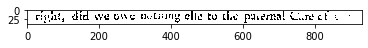

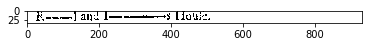

r103


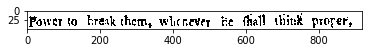

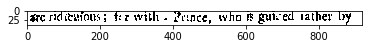

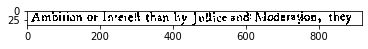

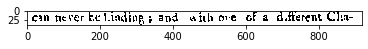

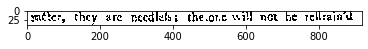

...

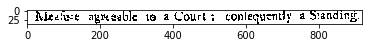

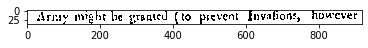

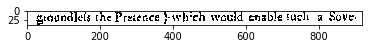

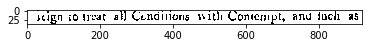

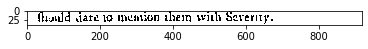

r211


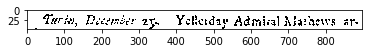

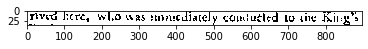

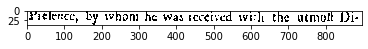

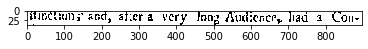

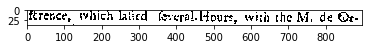

...

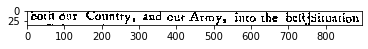

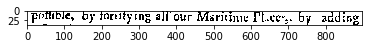

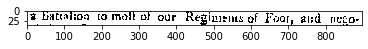

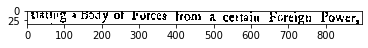

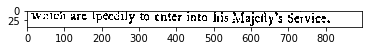

r219


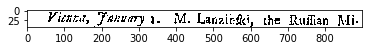

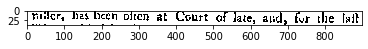

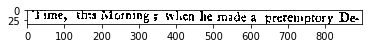

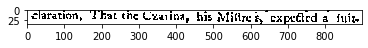

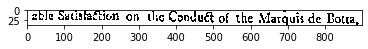

...

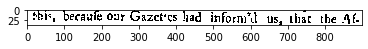

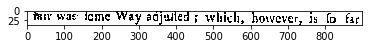

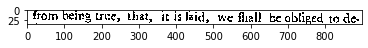

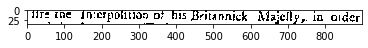

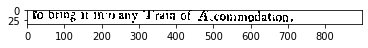

r225


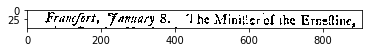

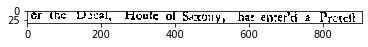

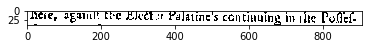

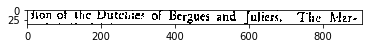

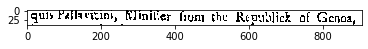

...

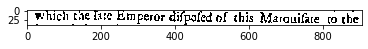

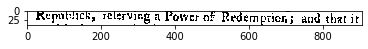

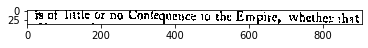

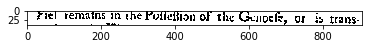

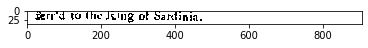

r235


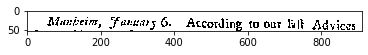

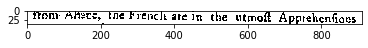

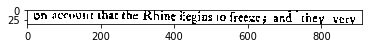

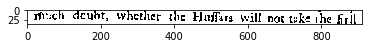

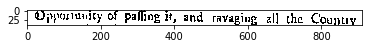

...

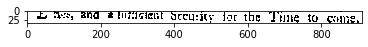

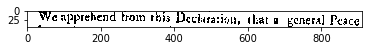

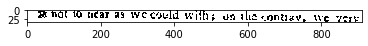

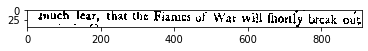

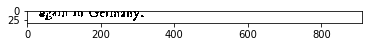

r253


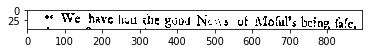

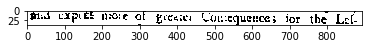

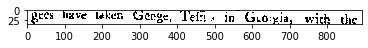

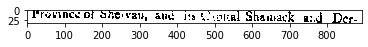

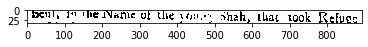

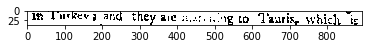

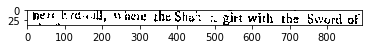

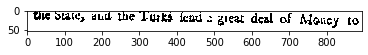

r277


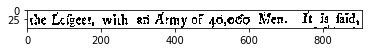

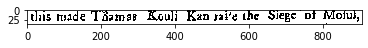

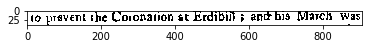

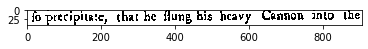

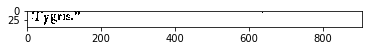

r285


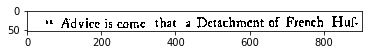

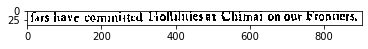

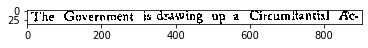

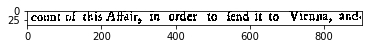

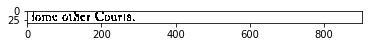

r289


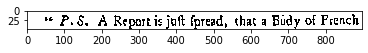

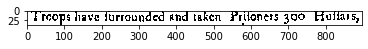

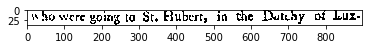

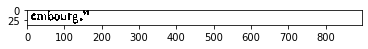

r305


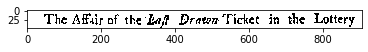

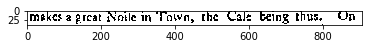

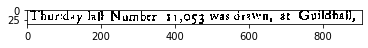

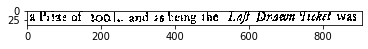

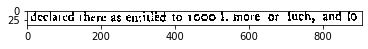

...

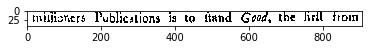

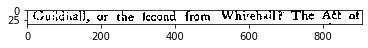

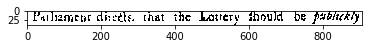

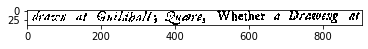

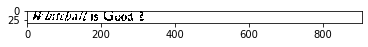

r369


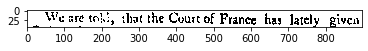

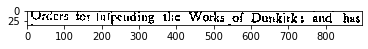

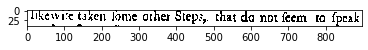

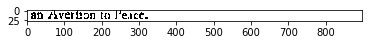

r373


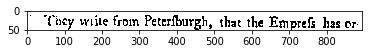

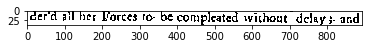

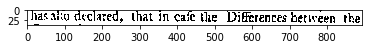

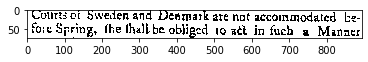

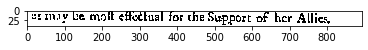

r377


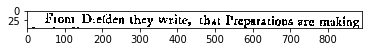

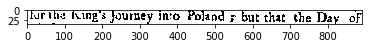

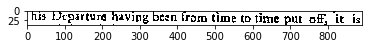

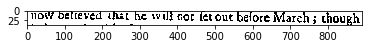

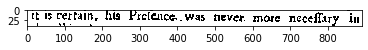

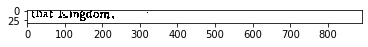

r389


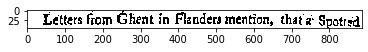

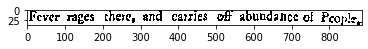

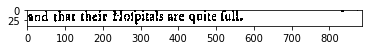

r397


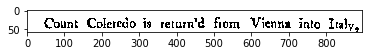

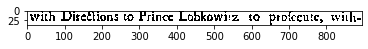

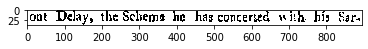

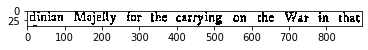

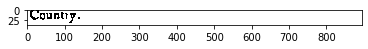

r405


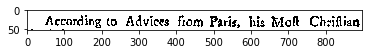

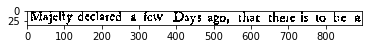

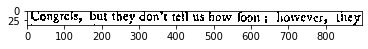

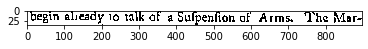

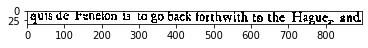

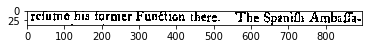

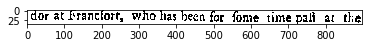

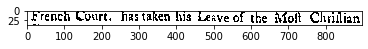

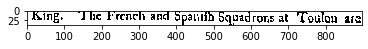

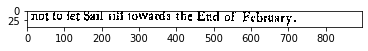

r413


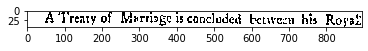

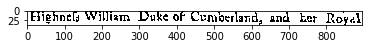

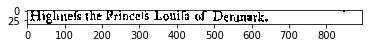

r437


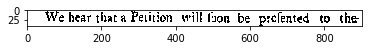

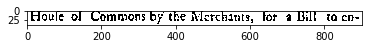

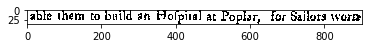

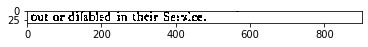

r445


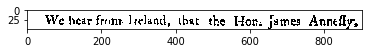

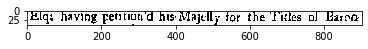

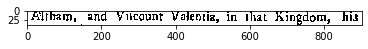

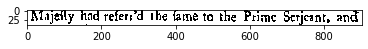

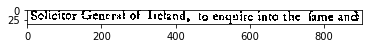

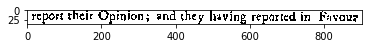

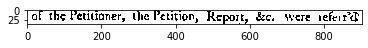

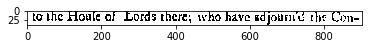

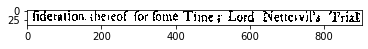

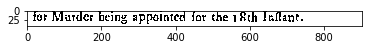

r453


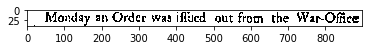

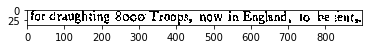

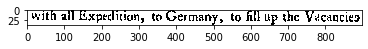

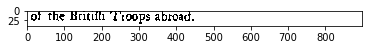

r461


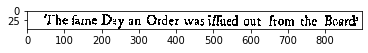

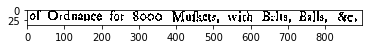

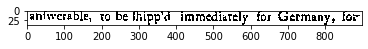

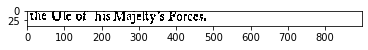

r469


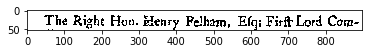

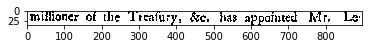

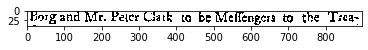

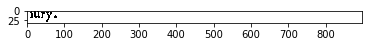

r431


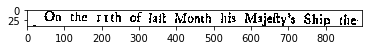

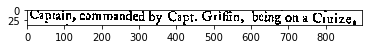

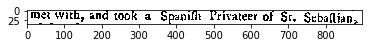

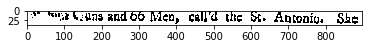

r438


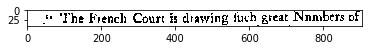

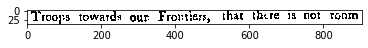

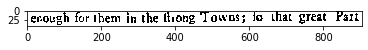

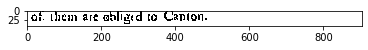

r167


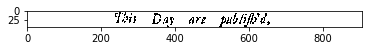

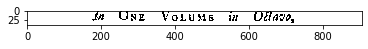

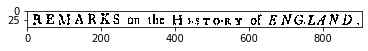

r55


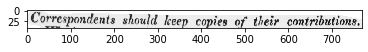

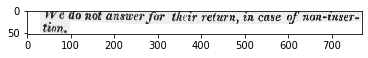

r60


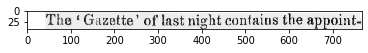

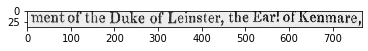

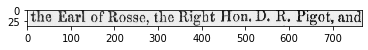

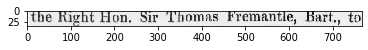

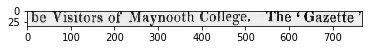

...

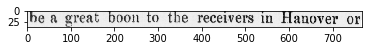

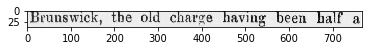

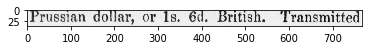

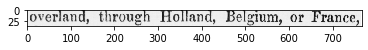

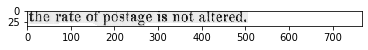

r61


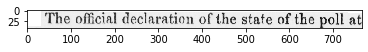

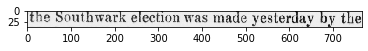

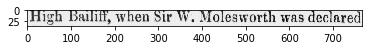

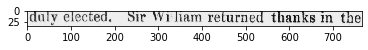

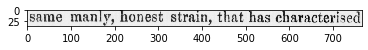

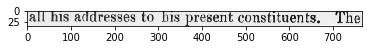

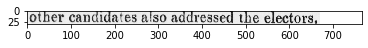

r62


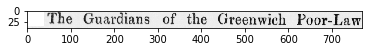

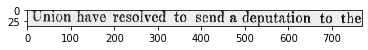

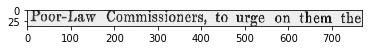

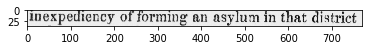

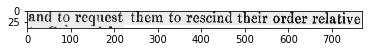

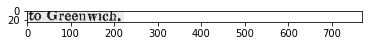

r63


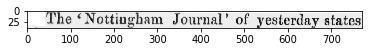

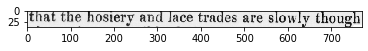

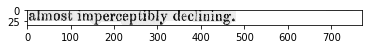

r18


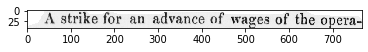

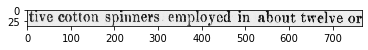

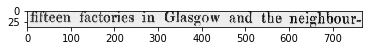

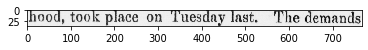

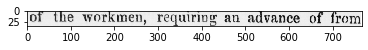

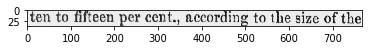

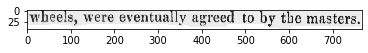

r20


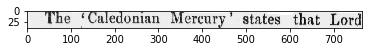

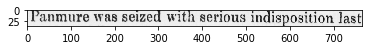

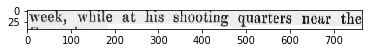

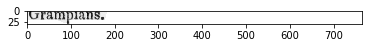

r21


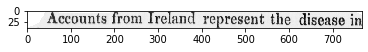

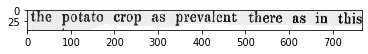

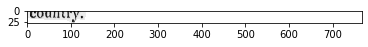

r22


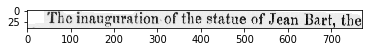

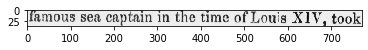

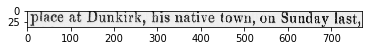

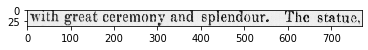

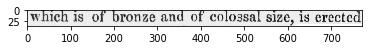

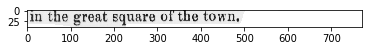

r23


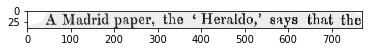

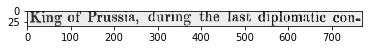

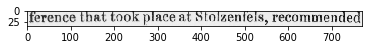

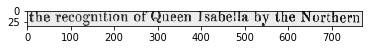

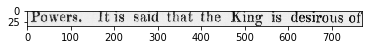

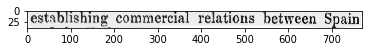

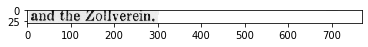

r24


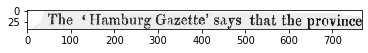

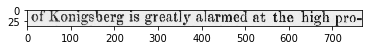

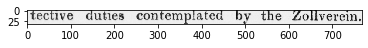

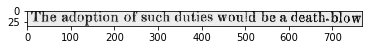

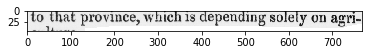

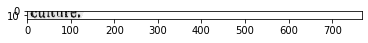

r25


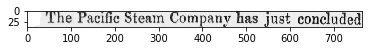

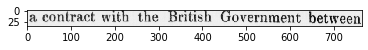

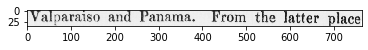

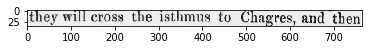

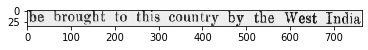

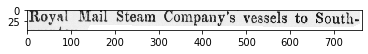

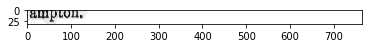

r28


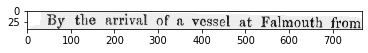

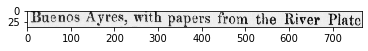

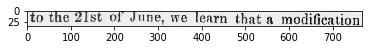

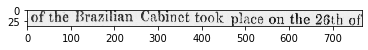

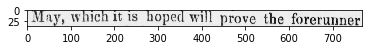

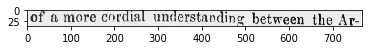

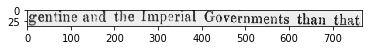

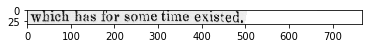

r29


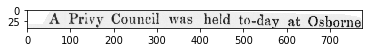

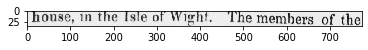

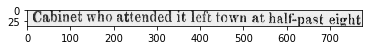

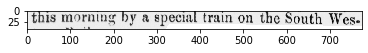

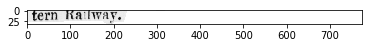

r31


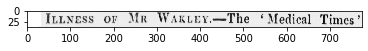

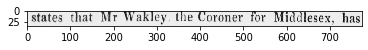

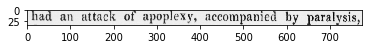

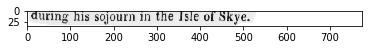

r34


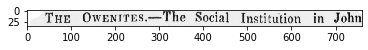

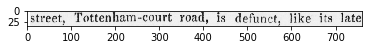

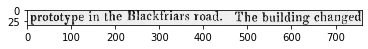

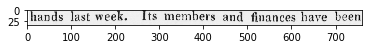

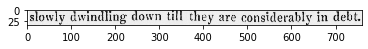

...

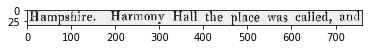

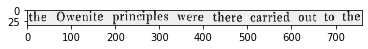

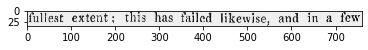

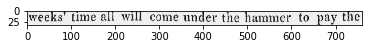

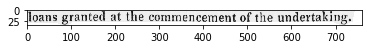

r35


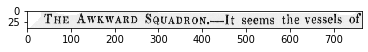

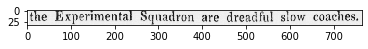

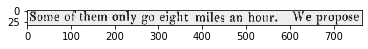

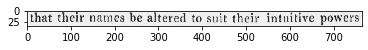

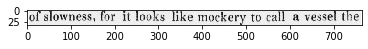

...

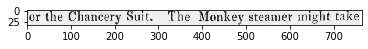

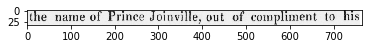

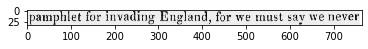

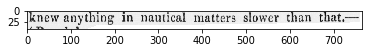

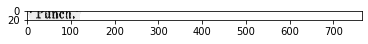

r36


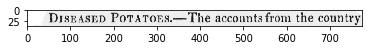

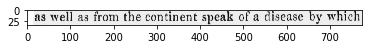

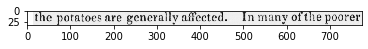

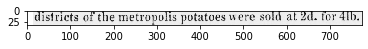

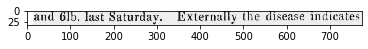

...

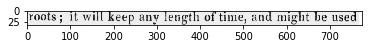

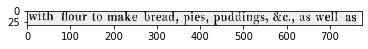

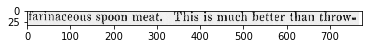

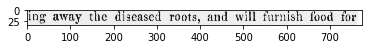

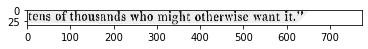

r38


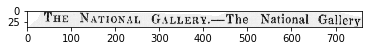

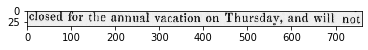

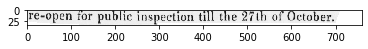

r39


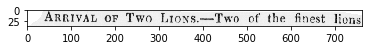

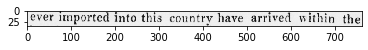

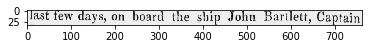

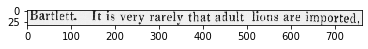

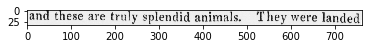

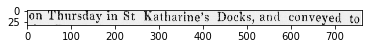

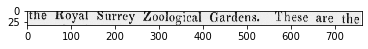

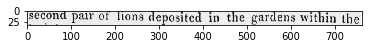

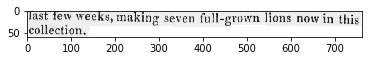

r40


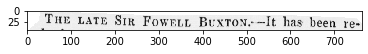

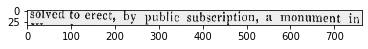

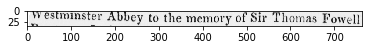

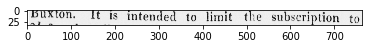

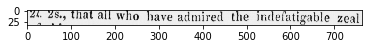

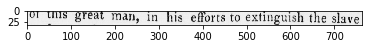

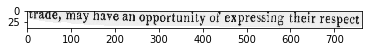

r42


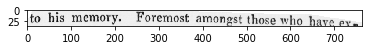

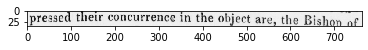

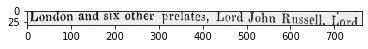

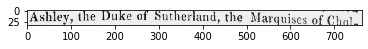

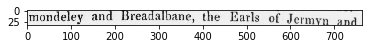

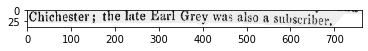

r44


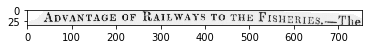

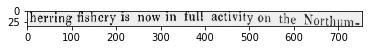

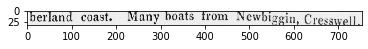

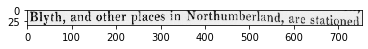

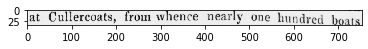

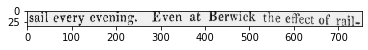

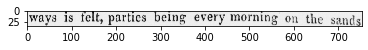

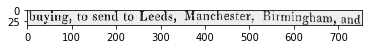

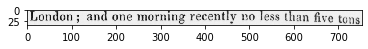

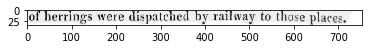

r45


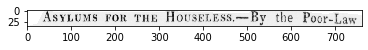

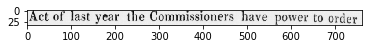

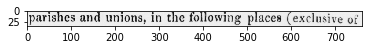

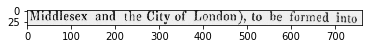

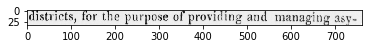

...

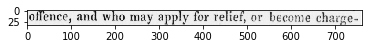

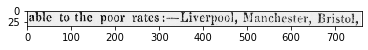

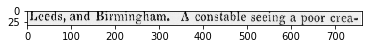

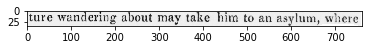

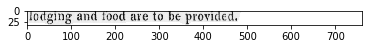

r48


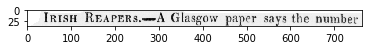

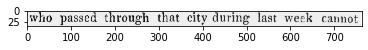

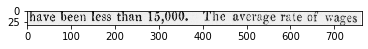

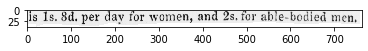

r65


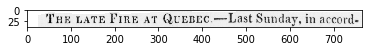

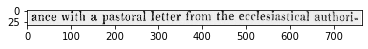

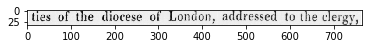

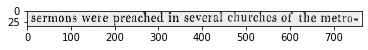

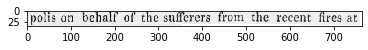

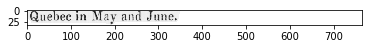

r66


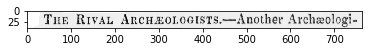

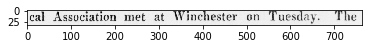

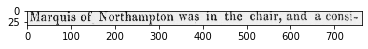

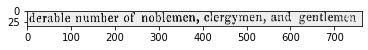

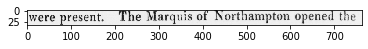

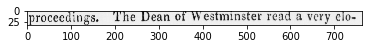

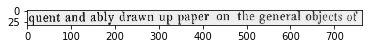

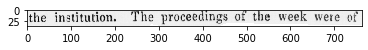

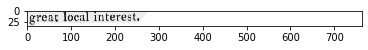

r67


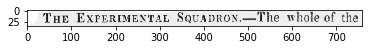

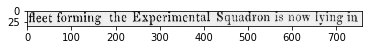

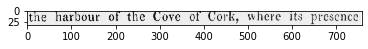

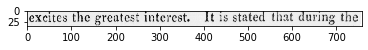

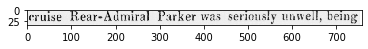

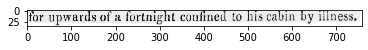

r68


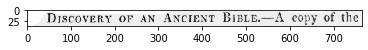

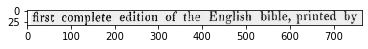

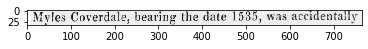

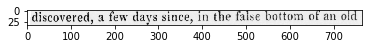

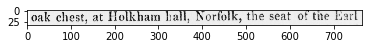

...

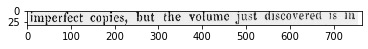

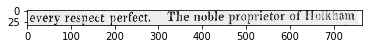

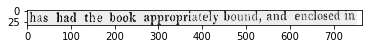

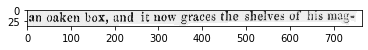

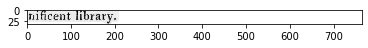

r69


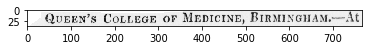

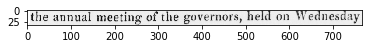

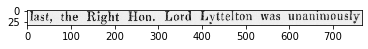

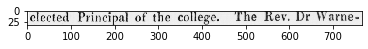

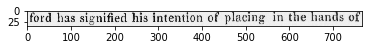

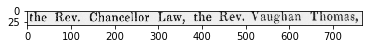

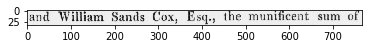

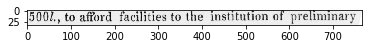

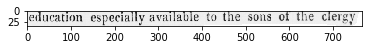

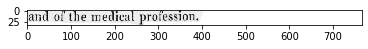

r70


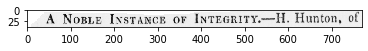

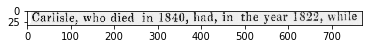

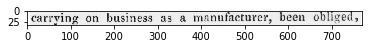

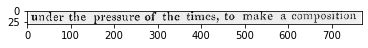

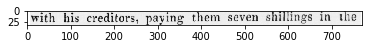

...

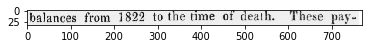

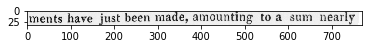

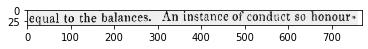

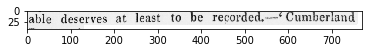

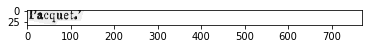

r72


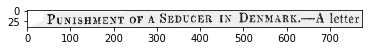

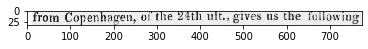

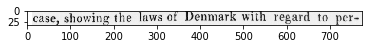

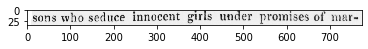

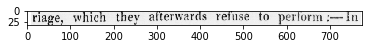

...

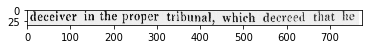

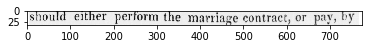

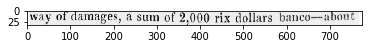

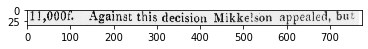

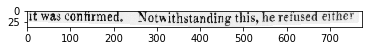

r3169


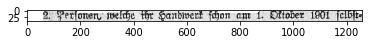

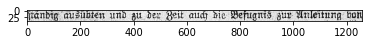

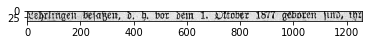

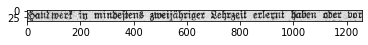

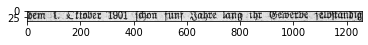

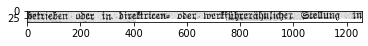

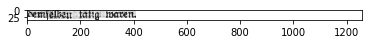

r3612


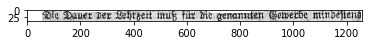

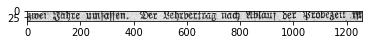

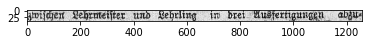

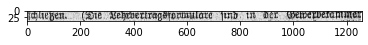

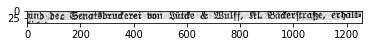

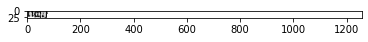

r5736


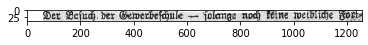

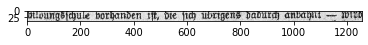

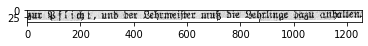

r5945


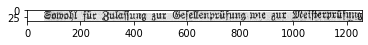

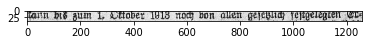

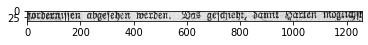

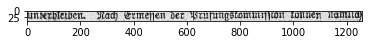

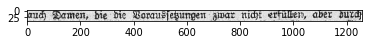

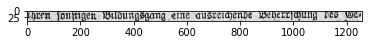

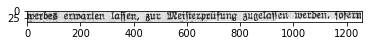

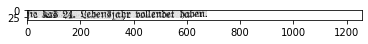

r6685


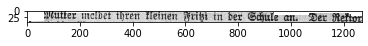

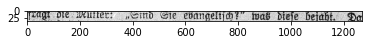

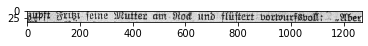

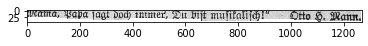

r7207


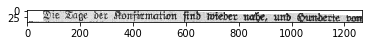

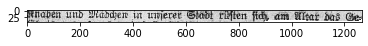

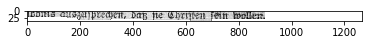

r7393


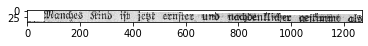

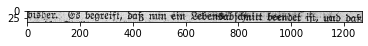

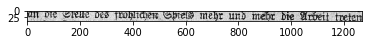

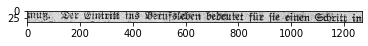

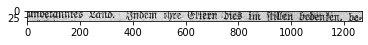

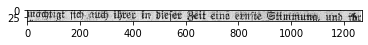

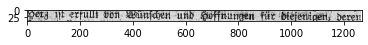

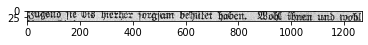

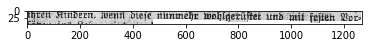

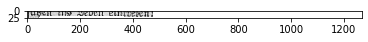

r9984


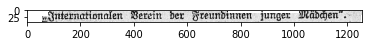

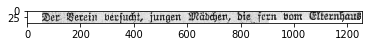

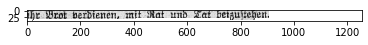

r10399


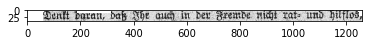

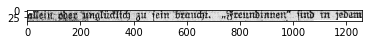

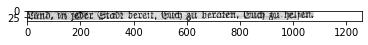

r10656


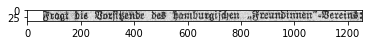

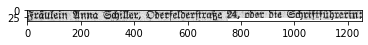

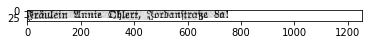

r12238


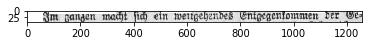

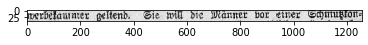

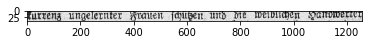

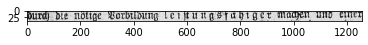

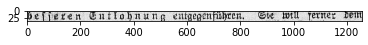

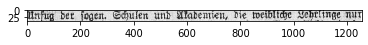

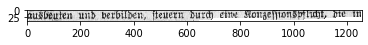

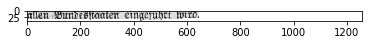

r12739


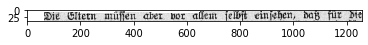

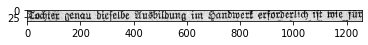

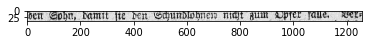

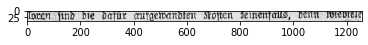

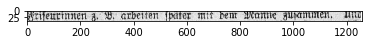

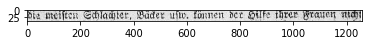

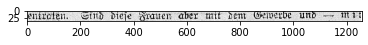

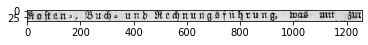

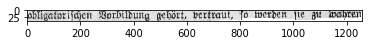

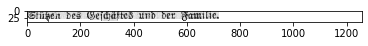

r13380


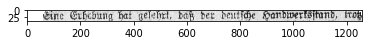

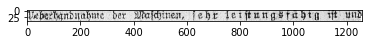

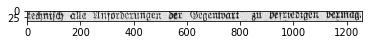

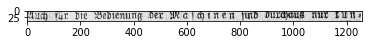

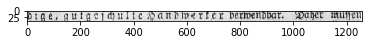

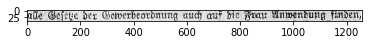

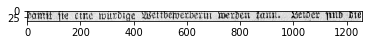

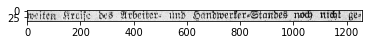

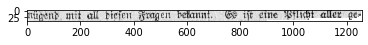

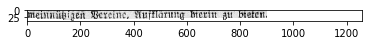

r14029


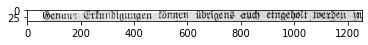

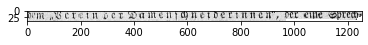

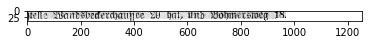

r14254


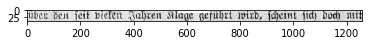

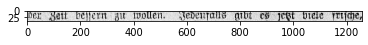

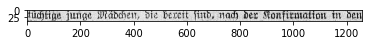

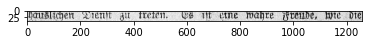

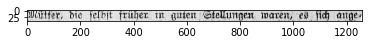

...

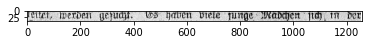

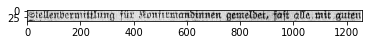

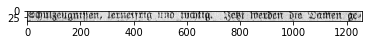

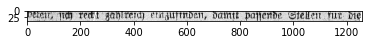

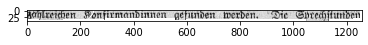

r15318


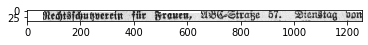

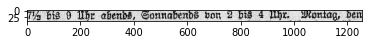

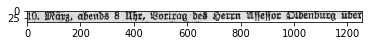

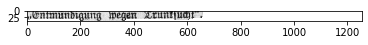

r15549


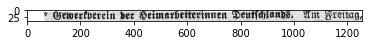

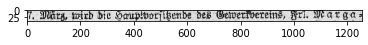

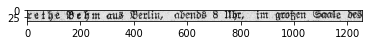

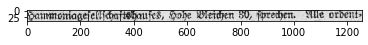

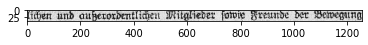

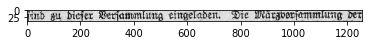

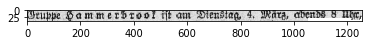

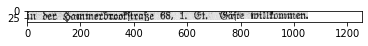

r16063


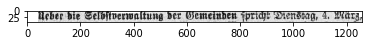

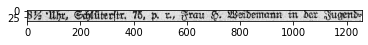

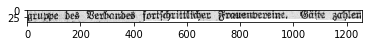

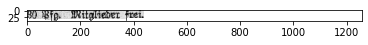

r16297


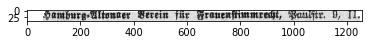

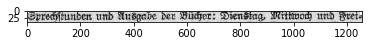

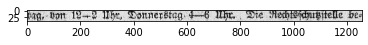

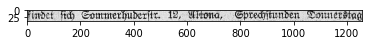

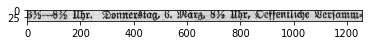

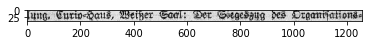

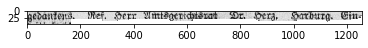

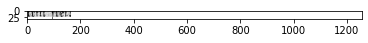

r16781


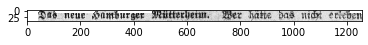

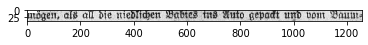

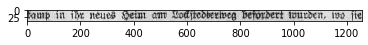

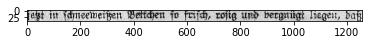

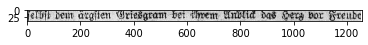

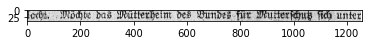

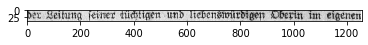

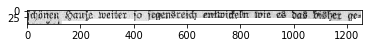

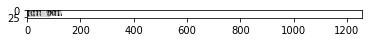

r18028


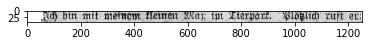

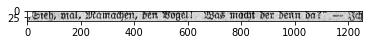

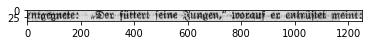

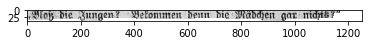

r18875


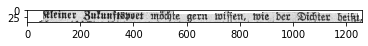

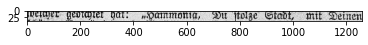

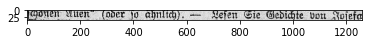

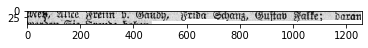

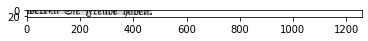

r19162


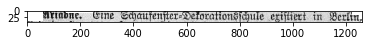

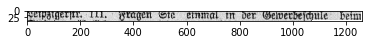

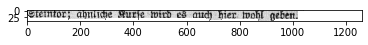

r19353


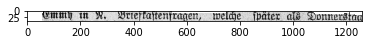

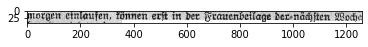

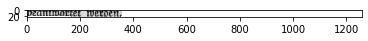

r19508


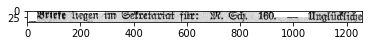

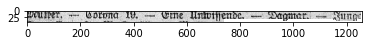

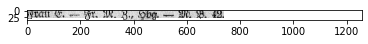

r19797


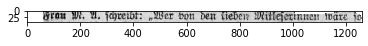

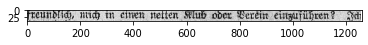

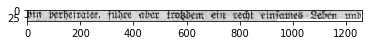

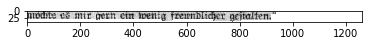

r20057


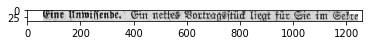

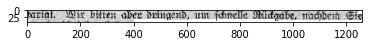

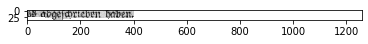

r20220


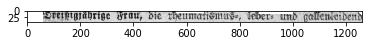

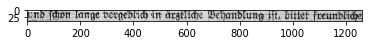

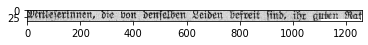

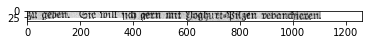

r20740


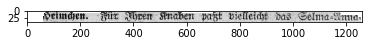

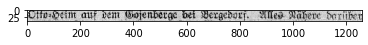

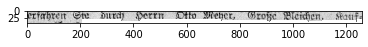

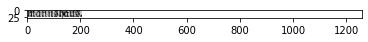

r20943


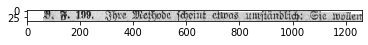

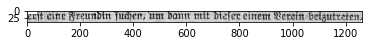

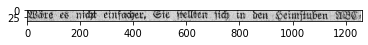

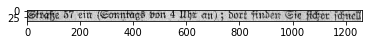

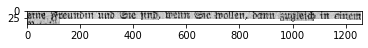

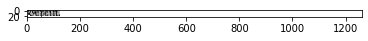

r1228


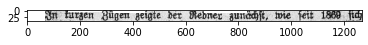

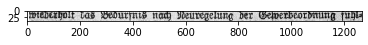

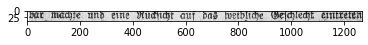

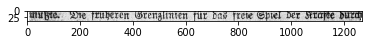

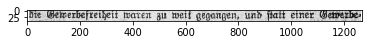

...

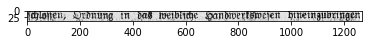

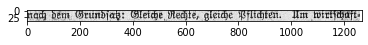

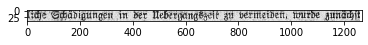

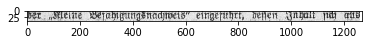

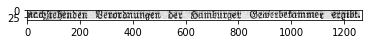

r2092


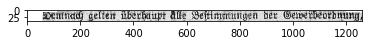

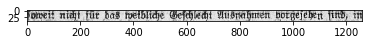

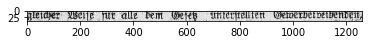

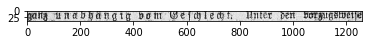

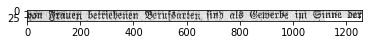

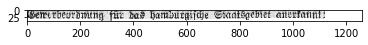

r11982


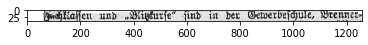

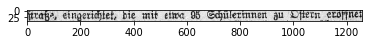

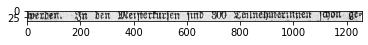

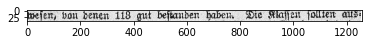

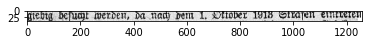

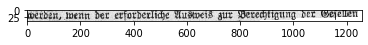

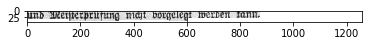

r187


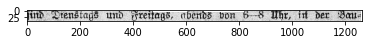

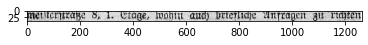

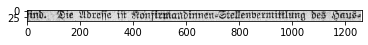

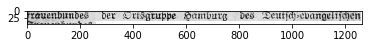

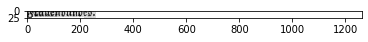

r195


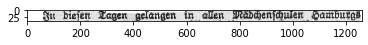

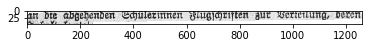

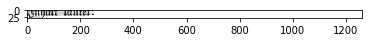

r199


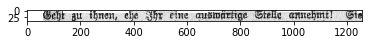

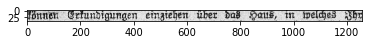

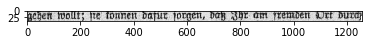

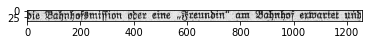

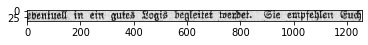

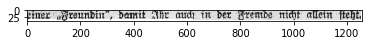

r17355


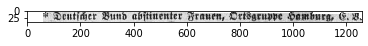

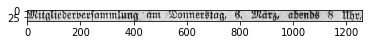

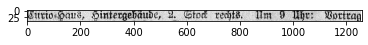

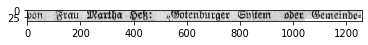

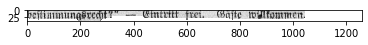

r17972


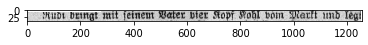

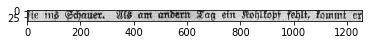

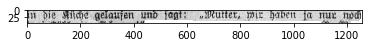

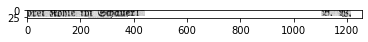

r189


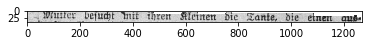

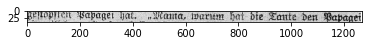

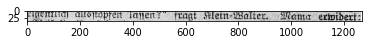

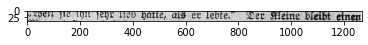

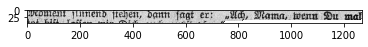

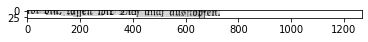

r6973


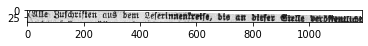

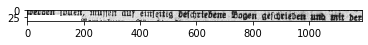

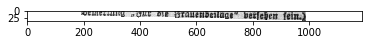

r11134


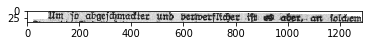

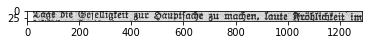

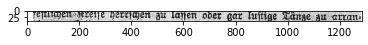

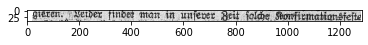

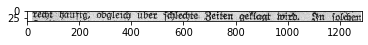

...

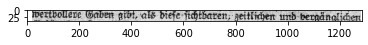

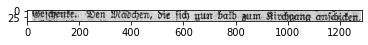

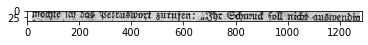

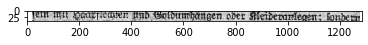

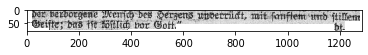

r11550


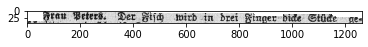

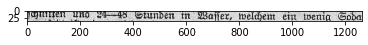

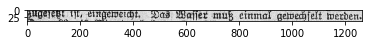

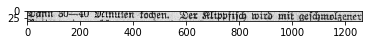

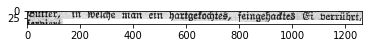

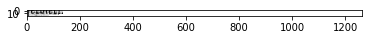

r212


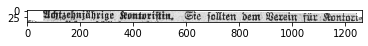

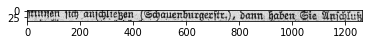

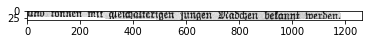

r225


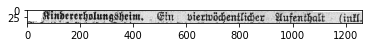

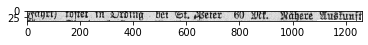

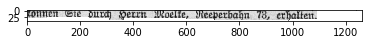

r231


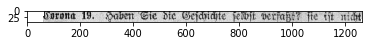

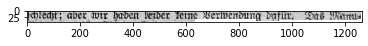

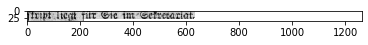

In [43]:
word_list = []
images = {}
lines_list = {}
incorrect_lines = {}
incorrect_words = {}
# regions = {}
for xml_file in ground_truth:
    if xml_file not in keep_dict: #xml_file !="pc-00674353.xml":
        continue
    #parse sml doc
    doc = xml.dom.minidom.parse("datasets/prima/"+xml_file)
    images[xml_file] = {}
    lines_list[xml_file] = {}
    incorrect_lines[xml_file] = {}
    incorrect_words[xml_file] = {}
#     regions[xml_file] = []
    #get image name from xml doc
    for a in doc.getElementsByTagName("Page"):
        image_name = a.getAttribute('imageFilename')

    im_full = rgb2gray(io.imread("datasets/prima/"+image_name))
    #         print("image name ", image_name)
    im_full = np.asarray(im_full)
    #select regions from image with multiple lines (>2), already present in groundtruth dict
    for txt_reg in doc.getElementsByTagName("TextRegion"):
        if txt_reg.getAttribute("type") == 'paragraph' and txt_reg.getAttribute("id") in ground_truth[xml_file].keys():# == 'r116': 
            if txt_reg.getAttribute("id") in keep_dict[xml_file]: #!= 'r108':
                continue
            print(txt_reg.getAttribute("id"))
            # read bounding points of region
            x_y = []
            reg = txt_reg.getAttribute("id")
            lines_list[xml_file][reg] = []
            for coords in txt_reg.getElementsByTagName("Coords"):
                for point in coords.getElementsByTagName("Point"):
                    x_y.append([point.getAttribute("x"), point.getAttribute("y")])
            x_y = np.asarray(x_y).astype(int)
            #create mask to crop out layer
            mask = np.zeros((max(x_y[:,1])-min(x_y[:,1]), max(x_y[:,0])-min(x_y[:,0])), dtype=np.uint8)
            rr, cc = polygon(x_y[:,1] - min(x_y[:,1]), x_y[:,0] - min(x_y[:,0]))
            mask[rr, cc] = 1
    #             plt.figure()
    #             plt.imshow(mask, cmap='gray')
            #crop region based on min-max of bounding points
            im = im_full[ min(x_y[:,1]): max(x_y[:,1]), min(x_y[:,0]):max(x_y[:,0])] 
            im = util.invert(im) * mask
            im = util.invert(im)
            #get horizontal proj. to segment line
            hor_proj = np.sum(util.invert(im), axis=1)
            hor_proj_smooth = savgol_filter(hor_proj, 21, 1)
    #             print(min(hor_proj), max(hor_proj))
    #             plt.figure(figsize=(30,5))
    #             plt.plot(np.arange(max(x_y[:,1])-min(x_y[:,1])), hor_proj)
    #             plt.plot(np.arange(max(x_y[:,1])-min(x_y[:,1])), hor_proj_smooth, c='r')
    #             plt.show()
            #get local minima from the smoothened hor. proj. 
            index_maxima = argrelextrema(hor_proj_smooth, np.greater)[0]
            index_minima = argrelextrema(hor_proj_smooth, np.less)[0]

#             plt.figure()
#             plt.imshow(im, cmap='gray')
#             plt.scatter(x = x_y[:,0]-min(x_y[:,0]), y = x_y[:,1] - min(x_y[:,1]))
#             for ind in index_minima:
#                 plt.scatter(x = 0, y=ind, c='r')
#             plt.show()
            
            image_list = []
            line_number = 0
            flag = 1
            #first line
            img_crop = im[0:index_minima[0], : ]
            if np.sum(img_crop) >= 1000 and np.sum(util.invert(img_crop)) >= 1000:
                lines_list[xml_file][reg].append(img_crop)
                plt.figure()
                plt.imshow(img_crop, cmap='gray')
                plt.show()
                
            for i in range(1, len(index_minima)):
                image_line = []
                #crop out each line
                img_crop = im[index_minima[i-1]:index_minima[i], : ]
                if np.sum(img_crop) <= 1000 or np.sum(util.invert(img_crop)) <= 1000:
                    continue
                plt.figure()
                plt.imshow(img_crop, cmap='gray')
                plt.show()
#                 print(np.sum(img_crop), np.sum(util.invert(img_crop)))
                #get vert. proj. to segment words
                lines_list[xml_file][reg].append(img_crop)
            #last line
            img_crop = im[index_minima[-1]:max(x_y[:,1]), : ]
            if np.sum(img_crop) >= 25 and np.sum(util.invert(img_crop)) >= 25:
                lines_list[xml_file][reg].append(img_crop)
                plt.figure()
                plt.imshow(img_crop, cmap='gray')
                plt.show()
#                 print(np.sum(util.invert(img_crop)))
#                 vert_proj = np.sum(util.invert(img_crop), axis=0)
#                 vert_proj_smooth = savgol_filter(vert_proj, 31, 2)
#     #                 plt.figure(figsize=(30,5))
#     #                 plt.plot(np.arange(vert_proj.shape[0]), vert_proj)
#     #                 plt.plot(np.arange(vert_proj.shape[0]), vert_proj_smooth, c='r')
#     #                 plt.show()
#                 index_min = argrelextrema(vert_proj_smooth, np.less)[0]
#     #             print(len(np.where(vert_proj_smooth<=0)[0]), len(index_min))
#                 #get sets of consecutive inidces where vert_proj[index] == 0, represents spaces
#                 spaces = consecutive(np.where(vert_proj_smooth<=0)[0], 7)
# #                 fig, axes = plt.subplots(1, len(spaces)-1, figsize=(30, 2))
# #                 for _i, ax in enumerate(axes.flat): # ax in range(1,len(spaces)):
#                 for _i in range(len(spaces)-1):
#                     #crop out a word
#                     word = img_crop[:, spaces[_i][int(len(spaces[_i])/2)]: spaces[_i+1][int(len(spaces[_i+1])/2)]]
#                     if np.sum(util.invert(word)) <=5 or np.sum(word) <= 5:
#                         continue
#                     word_list.append(word)
# #                     ax.imshow(word, cmap='gray')
# #                     plt.figure()
# #                     plt.imshow(word, cmap='gray')
#                     image_line.append(word)
#                 image_list.append(image_line)
#                 try:
#                     if len(ground_truth[xml_file][txt_reg.getAttribute("id")][line_number]) != len(image_line):
#     #                             print("incorrect no of words ", xml_file, txt_reg.getAttribute("id"))
#                         if txt_reg.getAttribute("id") not in incorrect_words[xml_file]:
#                             incorrect_words[xml_file][txt_reg.getAttribute("id")] = 1
#                         else:
#                             incorrect_words[xml_file][txt_reg.getAttribute("id")] += 1
#                         flag = 0
                        
#                     line_number += 1
#                 except IndexError:
#                     pass
#                     #print("incorrect number of lines", xml_file, txt_reg.getAttribute("id"), len(ground_truth[xml_file][txt_reg.getAttribute("id")]))
#             images[xml_file][txt_reg.getAttribute("id")] = image_list
#             if len(ground_truth[xml_file][txt_reg.getAttribute("id")]) != len(image_list):
#                 if txt_reg.getAttribute("id") not in incorrect_lines[xml_file]:
#                     incorrect_lines[xml_file][txt_reg.getAttribute("id")] = 1
#                 else:
#                     incorrect_lines[xml_file][txt_reg.getAttribute("id")] += 1
# #             else:
# #                 regions[xml_file].append(txt_reg.getAttribute("id"))

In [44]:
import pickle
output = open('lines_list_all.pkl', 'wb')
pickle.dump(lines_list, output)
output.close()

In [13]:
# sum(len(k) for k in regions1)
count = 0
k_max = None
for k in regions1:
    if count< len(regions1[k]):
        count = len(regions1[k])
        k_max = k

In [14]:
k_max

'pc-00674348.xml'

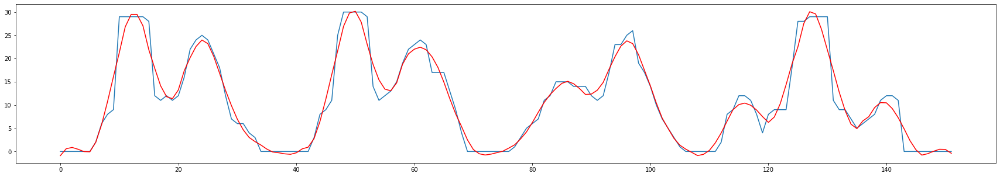

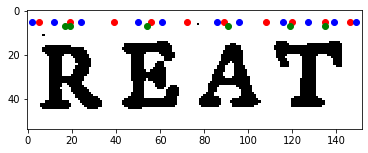

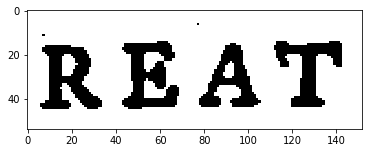

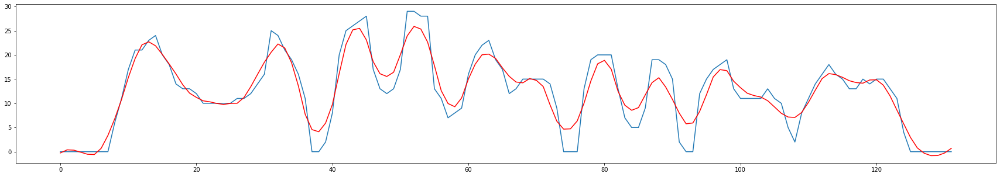

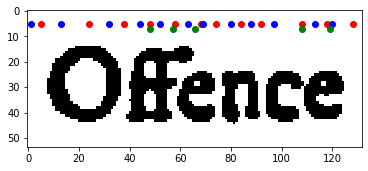

...

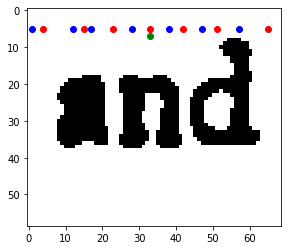

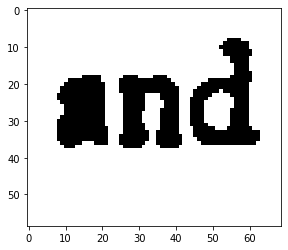

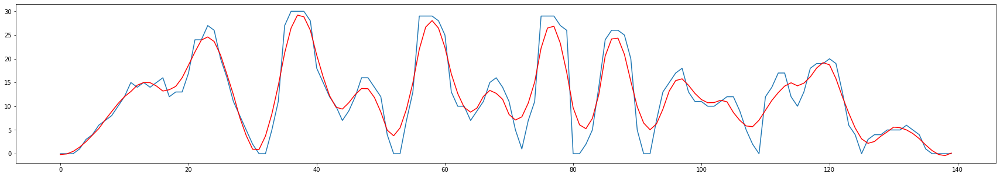

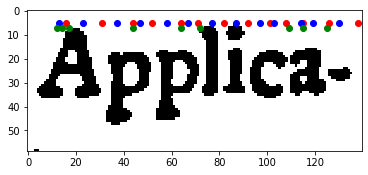

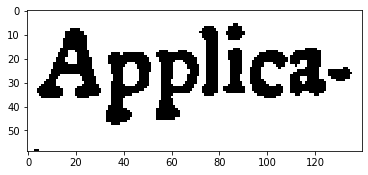

In [39]:
for word in word_list:
#     word = unsharp_mask(word, radius=20, amount=1)
    vert_proj = np.sum(util.invert(word), axis=0)
    vert_proj_smooth = savgol_filter(vert_proj, 11, 3)
    
    plt.figure(figsize=(30,5))
    plt.plot(np.arange(vert_proj.shape[0]), vert_proj)
    plt.plot(np.arange(vert_proj.shape[0]), vert_proj_smooth, c='r')
    plt.show()
    index_min2 = argrelextrema(vert_proj, np.less)[0]
    index_min = argrelextrema(vert_proj_smooth, np.less)[0]
    index_max = argrelextrema(vert_proj_smooth, np.greater)[0]
    plt.figure()
    plt.imshow(word, cmap='gray')
    for ind in index_min:
        plt.scatter( ind, 5, c='r')
    for ind in index_max:
        plt.scatter( ind, 5, c='b')
    for ind in index_min2:
        if vert_proj[ind]<15:
            plt.scatter(ind, 7, c='g')
    contours = measure.find_contours(word, 0.8)
    print(coun)
    fig, ax = plt.subplots()
    ax.imshow(word, cmap=plt.cm.gray)
    for contour in contours:
        ax.plot(contour[:, 1], contour[:, 0], linewidth=2)

8  lines
(54, 963)


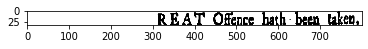

(47, 963)


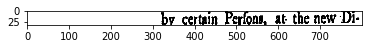

(49, 963)


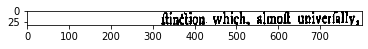

(48, 963)


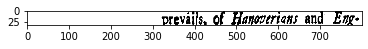

(49, 963)


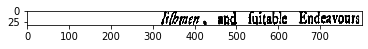

(47, 963)


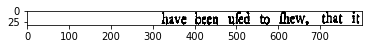

(47, 963)


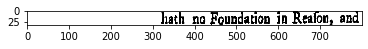

(59, 963)


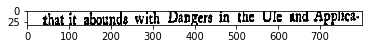

In [19]:
from skimage.transform import resize
import pickle
pkl_file = open('lines_list.pkl', 'rb')
image_list = pickle.load(pkl_file)
pkl_file.close()
for xml_file in image_list:
    for reg in image_list[xml_file]:
        print(len(image_list[xml_file][reg]), " lines")
        for line in image_list[xml_file][reg]:
#             print(len(line), " words")
#             for word in line:
#                 
#                 if word.shape[-1] <400:
#                     word = np.pad(word, ((0,0), (int((800-word.shape[-1])/2), int((800-word.shape[-1])/2))), 'maximum')
#                 print(word.shape)
#                 word = resize(word, (33,800))
            print(line.shape)
            if line.shape[0]>33:
              line_new = resize(line[int(line.shape[0]/2)-16: int(line.shape[0]/2)+16], (33,800))
            
#             if np.sum(line[:, 0:200]) == 0:
#                 line_new = resize(line[:, 200:], (33,800))
            else:
                line_new = resize(line, (33,800))
            plt.figure()
            plt.imshow(line_new, cmap='gray')
            plt.show()

In [43]:
a = np.asarray([[1,2,2,1], [1,2,3,1]])
b = 8
np.pad(a, ((0,0), (2, 2)), 'maximum')

array([[2, 2, 1, 2, 2, 1, 2, 2],
       [3, 3, 1, 2, 3, 1, 3, 3]])

In [7]:
line

[array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
 array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
 array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
 array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 25